In [1]:
include("harvey.jl")
using .julia



using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions


using NLopt

using Plots
using StatsPlots  
using DataFrames
using XLSX



## Load data

In [2]:

file_path = "data/Data 1870-2023.xlsx"
sheet_name = "Sheet1"

data = XLSX.readtable(file_path, sheet_name) |> DataFrame

println(data)

num_obs = size(data, 1)
println("Number of observations: ", num_obs)


153×2 DataFrame
 Row │ 1870  1227    
     │ Any   Any     
─────┼───────────────
   1 │ 1871  1238
   2 │ 1872  1302.0
   3 │ 1873  1299.0
   4 │ 1874  1333.0
   5 │ 1875  1355.0
   6 │ 1876  1384.0
   7 │ 1877  1346.0
   8 │ 1878  1399.0
   9 │ 1879  1445.0
  10 │ 1880  1480.0
  11 │ 1881  1496.0
  12 │ 1882  1552.0
  13 │ 1883  1606.0
  14 │ 1884  1616.0
  15 │ 1885  1627.0
  16 │ 1886  1689.0
  17 │ 1887  1747.0
  18 │ 1888  1766.0
  19 │ 1889  1792.0
  20 │ 1890  1897.0
  21 │ 1891  1934.0
  22 │ 1892  1980.0
  23 │ 1893  2017.0
  24 │ 1894  2059.0
  25 │ 1895  2175.0
  26 │ 1896  2254.0
  27 │ 1897  2305.0
  28 │ 1898  2349.0
  29 │ 1899  2449.0
  30 │ 1900  2531.0
  31 │ 1901  2634.0
  32 │ 1902  2694.0
  33 │ 1903  2853.0
  34 │ 1904  2920.0
  35 │ 1905  2971.0
  36 │ 1906  3057.0
  37 │ 1907  3173.0
  38 │ 1908  3265.0
  39 │ 1909  3388.0
  40 │ 1910  3491.0
  41 │ 1911  3680.0
  42 │ 1912  3697.0
  43 │ 1913  3836.0
  44 │ 1914  4057.0
  45 │ 1915  3752.0
  46 │ 1916  3901.0


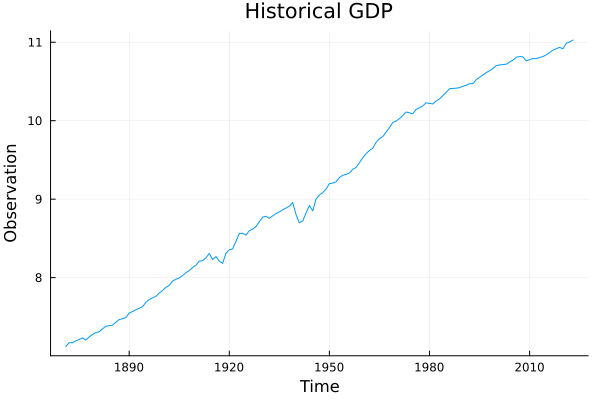

In [3]:
y = data[:, 2]
y = log.(y)
dates = data[:, 1]
for i in 1:length(dates)
    year = parse(Int, dates[i][1:4])
    dates[i] = year 
end
dates = Float64.(dates)


# Plot the data
plot(dates,y, title="Historical GDP", xlabel="Time", ylabel="Observation", label = false)

In [4]:
#Define model
n_order = 2
state_dim = 2 + 2 * n_order
alpha_init = zeros(state_dim)
alpha_init[1] = y[1]
P1 = Matrix{Float64}(I(state_dim))  # Initial covariance matrix

#Priors
a_rho = 0.001
b_rho = 0.97
a_lambda = 0.001
b_lambda = π
a_xi = 1e-6
b_xi =1e6
a_kappa = 1e-6
b_kappa = 1e6
a_epsilon = 1e-6  
b_epsilon = 1e6
priors = [a_rho, b_rho, a_lambda, b_lambda, a_xi, b_xi, a_kappa, b_kappa, a_epsilon, b_epsilon]




10-element Vector{Float64}:
 0.001
 0.97
 0.001
 3.141592653589793
 1.0e-6
 1.0e6
 1.0e-6
 1.0e6
 1.0e-6
 1.0e6

In [5]:
# Run MCMC initialization
chain_init_burned, Sigma, acceptance_rate_init, chain_init = initialize_mcmc(
    y,
    priors,
    alpha_init, 
    P1, 
    n_order; 
    n_init=40000, 
    burn_init=20000, 
    omega_init=0.08)


Initialization Phase 100%|███████████████████████████████| Time: 0:00:27


Initialization Acceptance Rate: 35.33 %


([-0.1445591954069477 -4.848731488341249 … -20.821358026736593 -23.73019989628419; -0.1445591954069477 -4.848731488341249 … -20.821358026736593 -23.73019989628419; … ; 0.05950895551265015 -2.7182738487304343 … -20.847646507209543 -23.664240968586956; 0.05950895551265015 -2.7182738487304343 … -20.847646507209543 -23.664240968586956], [0.1465570836356533 -0.15770357755482697 … -0.02350158742749596 0.1993735514473766; -0.15770357755482697 1.46643381292937 … -0.03326568312709926 -0.1915555536147627; … ; -0.02350158742749596 -0.03326568312709926 … 0.06283317141565477 -0.15585574375101843; 0.1993735514473766 -0.1915555536147627 … -0.15585574375101843 1.225710490338174], 0.3533, [-0.18264021482594758 -0.413869989037169 … -0.061564989213735793 0.1392281051807137; -0.18264021482594758 -0.413869989037169 … -0.061564989213735793 0.1392281051807137; … ; 0.05950895551265015 -2.7182738487304343 … -20.847646507209543 -23.664240968586956; 0.05950895551265015 -2.7182738487304343 … -20.847646507209543 -

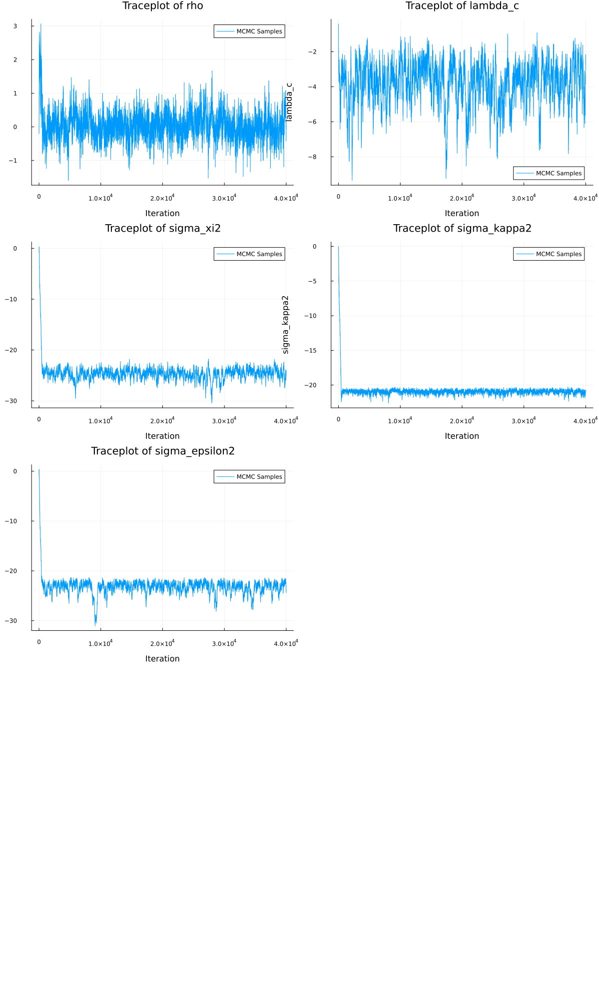

In [6]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)


# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples_init = chain_init[:, i]
    
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples_init, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")

    
    # Add plots to the list
    push!(p_list, p2)
end

# Display the plots
nrows = n_params
ncols = 2
plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))


In [7]:
# Run MCMC recursion
theta_samples_burned, alpha_samples, acceptance_rate_rec = recursion_mcmc(
    y, 
    priors,
    alpha_init, 
    P1, 
    n_order, 
    chain_init_burned, 
    Sigma; 
    n_rec=40000, 
    burn_rec=20000, 
    omega_rec=0.5)


Recursion Phase 100%|████████████████████████████████████| Time: 0:01:05m


Recursion Acceptance Rate: 34.685 %


([0.5307342699857087 0.23142806137338057 … 0.0010073022013827452 4.706115715402358e-5; 0.553797388582838 0.23015358278189385 … 0.0008416306863762733 6.173117547973847e-5; … ; 0.3989595545621919 0.03605082847997847 … 0.0008739470794489077 1.4232796783700666e-5; 0.40164162768085704 0.060523761409509325 … 0.0009328162737231048 1.0001595718607706e-5], Any[[7.143490122842547 0.018965232593924075 … -0.03168427895050168 0.4820965358077474; 7.162455355436469 0.01579515213557875 … 0.004301950558178724 0.23429506731396826; … ; 10.891678070437855 0.017944738296641616 … 0.11005166530445475 0.04940245121198067; 10.909622808734497 0.016520509267713868 … 0.11967318376560612 0.04636861216631993], [6.970087473382103 0.04349364527489519 … 0.15448229202899832 -2.0699767941889875; 7.0135811186571715 0.04170034684056623 … 0.15345904750270223 -1.0936439820131874; … ; 11.002464678455688 0.012135600201354235 … -0.0017430779007804181 -0.07199980389070063; 11.014600278657042 0.016425792095794423 … 0.01009331109

In [8]:

# Initial guesses for parameters
initial_params = [0.5, 0.2, 1e-5, 1e-5, 1e-5]

# Bounds for parameters
lower_bounds = [0.0, 0.0, 1e-6, 1e-6, 1e-6]
upper_bounds = [0.999, π, Inf, Inf, Inf]


# Define the objective function
function obj(params::Vector, grad::Vector)
    try
        return negative_log_likelihood(params, y, alpha_init, P1, n_order)
    catch e
        return 1e10  # Return a large number in case of error
    end
end

# Create the optimizer
opt = Opt(:LN_NELDERMEAD, length(initial_params))
opt.lower_bounds = lower_bounds
opt.upper_bounds = upper_bounds
opt.min_objective = obj
opt.maxeval = 100000
opt.xtol_rel = 1e-10

# Run the optimization
(minf, estimated_params, ret) = NLopt.optimize(opt, initial_params)

# Display the estimated parameters
println("Estimated Parameters: ", estimated_params)


Estimated Parameters: [0.5086879409314145, 1.5166365228784041e-9, 8.347834655669076e-6, 0.0009349946223088583, 6.138927361677915e-5]


In [9]:
parameters = ["rho", "lambda_c", "sigma_xi2", "sigma_kappa2", "sigma_epsilon2"]
n_params = length(parameters)




5

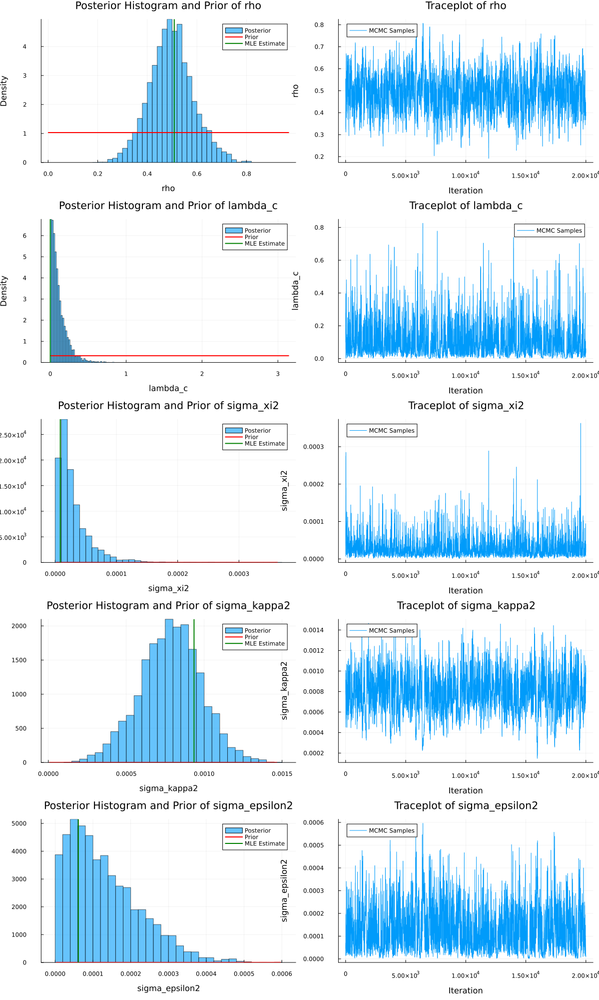

"c:\\Users\\marti\\OneDrive - University of Copenhagen\\Økonomi\\9. semester\\Empirical macro\\State-Space-Model-Estimation-1\\Harvey\\results\\harvey_estimation_historic.pdf"

In [10]:
# Initialize a list to hold the plots
p_list = []

for i in 1:n_params
    param_samples = theta_samples_burned[:, i]
    
    # Histogram of posterior samples
    p1 = histogram(param_samples, bins=50, normalize=true, alpha=0.6,
                   label="Posterior", xlabel=parameters[i], ylabel="Density",
                   title="Posterior Histogram and Prior of $(parameters[i])")
    
    # Define the prior distribution
    if parameters[i] == "rho"
        # Uniform prior between 0 and 0.999
        x_values = range(a_rho, b_rho, length=200)
        prior_pdf = pdf.(Uniform(a_rho, b_rho), x_values)
    elseif parameters[i] == "lambda_c"
        # beta distribution
        x_values = range(a_lambda, b_lambda, length=200)
        prior_pdf = pdf.(Uniform(a_lambda, b_lambda), x_values)
    elseif parameters[i] == "sigma_xi2"
        # Inverse Gamma prior
        x_values = range(0.0, maximum(param_samples), length=200)
        prior_pdf = pdf.(InverseGamma(a_xi, b_xi), x_values)
    elseif parameters[i] == "sigma_kappa2"
        # Inverse Gamma prior
        x_values = range(0.0, maximum(param_samples), length=200)
        prior_pdf = pdf.(InverseGamma(a_kappa, b_kappa), x_values)
    elseif parameters[i] == "sigma_epsilon2"
        # Inverse Gamma prior
        x_values = range(0.0, maximum(param_samples), length=200)
        prior_pdf = pdf.(InverseGamma(a_epsilon, b_epsilon), x_values)
    end
    
    # Overlay prior PDF on histogram
    plot!(p1, x_values, prior_pdf, label="Prior", color=:red, linewidth=2)

    #add mle estimate
    vline!([estimated_params[i]], label="MLE Estimate", color=:green, linewidth=2)
    
    # Traceplot of MCMC samples
    p2 = plot(param_samples, label="MCMC Samples", xlabel="Iteration", ylabel=parameters[i],
              title="Traceplot of $(parameters[i])")



    
    # Add plots to the list
    push!(p_list, p1)
    push!(p_list, p2)
end

# Display the plots 
nrows = n_params
ncols = 2
recursion_plot = plot(p_list..., layout=(nrows, ncols), size=(1200, 400 * n_params))
display(recursion_plot)
savefig(recursion_plot, "results/harvey_estimation_historic.pdf")




In [11]:
# Calculate means of posterior samples
chain_rec_burned_means = mean(theta_samples_burned, dims=1)  # 1 x n_params array
chain_rec_burned_means = vec(chain_rec_burned_means)  # Convert to a vector


5-element Vector{Float64}:
 0.4973657495068318
 0.11130323520545897
 2.895886751019956e-5
 0.0007839358117954734
 0.00013054744402254227

In [12]:

# Create the DataFrame
estimates_table = DataFrame(Dict(
    "Parameter" => parameters,
    "MCMC Estimate" => chain_rec_burned_means,
    # "MLE Estimate" => estimated_params,  # Include if available
    # "True Value" => params_true
))

# Display the DataFrame
display(estimates_table)


Row,MCMC Estimate,Parameter
,Float64,String
1,0.497366,rho
2,0.111303,lambda_c
3,2.89589e-5,sigma_xi2
4,0.000783936,sigma_kappa2
5,0.000130547,sigma_epsilon2


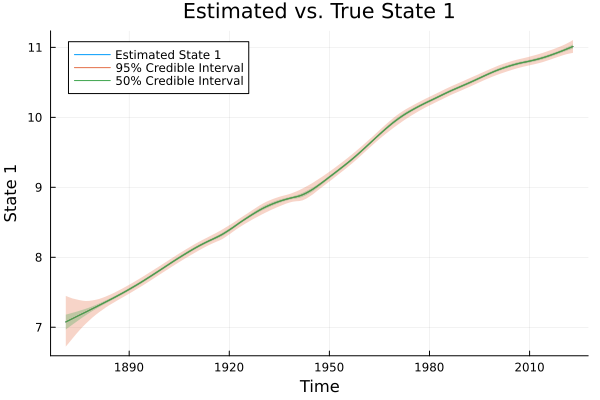

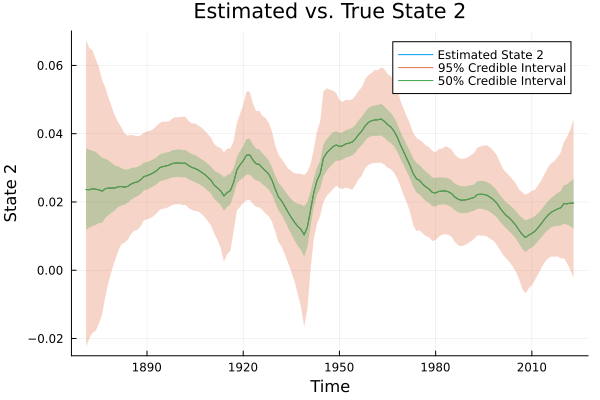

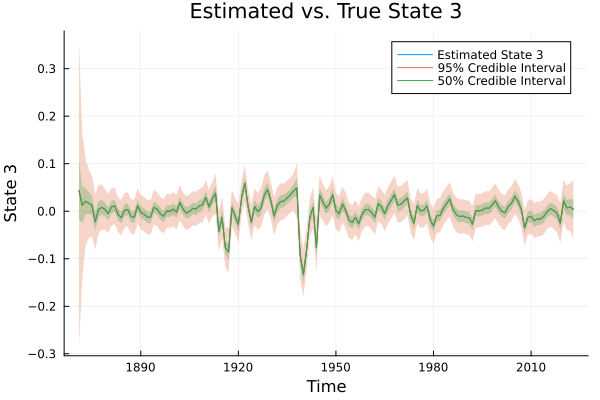

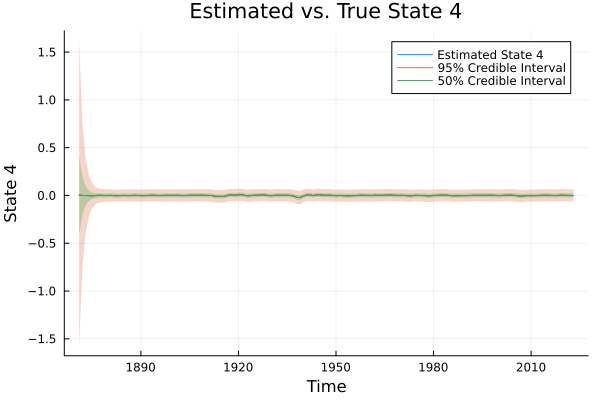

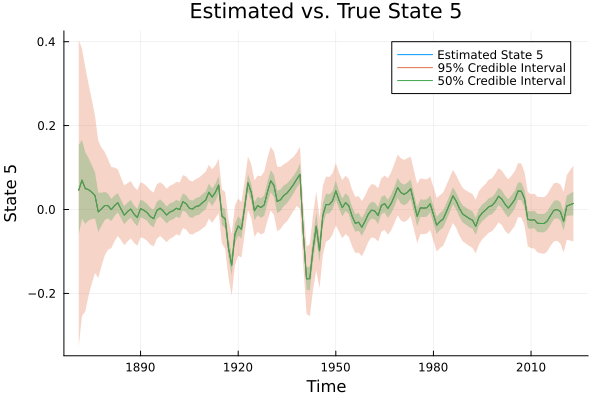

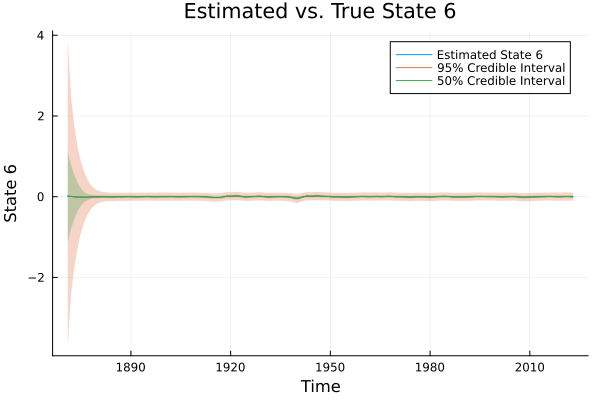

In [13]:
# Collect alpha samples into a 3D array
n_samples = length(alpha_samples)
n_time_steps = size(alpha_samples[1], 1)
state_dim = size(alpha_samples[1], 2)

dates = dates


# Initialize array to hold alpha samples
alpha_samples_array = Array{Float64}(undef, n_samples, n_time_steps, state_dim)

for i in 1:n_samples
    alpha_samples_array[i, :, :] = alpha_samples[i]
end


# Compute posterior mean over samples (dimension 1)
alpha_mean = mean(alpha_samples_array, dims=1)  # 1 x n_time_steps x state_dim
alpha_mean = dropdims(alpha_mean; dims=1)  # n_time_steps x state_dim

# Compute credible intervals 95 percent coverage
alpha_lower = mapslices(x -> quantile(x, 0.025), alpha_samples_array; dims=1)
alpha_lower = dropdims(alpha_lower; dims=1)
alpha_upper = mapslices(x -> quantile(x, 0.975), alpha_samples_array; dims=1)
alpha_upper = dropdims(alpha_upper; dims=1)

#compute credible intervals 68 percent coverage
alpha_lower_68 = mapslices(x -> quantile(x, 0.25), alpha_samples_array; dims=1)
alpha_lower_68 = dropdims(alpha_lower_68; dims=1)
alpha_upper_68 = mapslices(x -> quantile(x, 0.75), alpha_samples_array; dims=1)
alpha_upper_68 = dropdims(alpha_upper_68; dims=1)



time = 1:n_time_steps

for s in 1:state_dim
    p = plot(dates, alpha_mean[:, s], label="Estimated State $(s)", xlabel="Time",
             ylabel="State $(s)", title="Estimated vs. True State $(s)")
    
    # Add credible intervals
    plot!(dates, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower[:, s],
          alpha_upper[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="95% Credible Interval")
    plot!(dates, alpha_mean[:, s], ribbon=(alpha_mean[:, s] .- alpha_lower_68[:, s],
          alpha_upper_68[:, s] .- alpha_mean[:, s]), fillalpha=0.3, label="50% Credible Interval")
  
    display(p)
end


In [14]:
using JLD2

# Save the states to a JLD2 file
@save "results/states_harvey_historic.jld2" alpha_mean alpha_lower alpha_upper alpha_lower_68 alpha_upper_68 dates



(153,)
(153,)


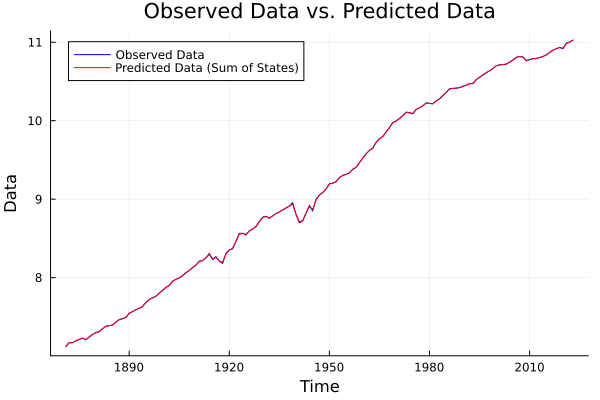

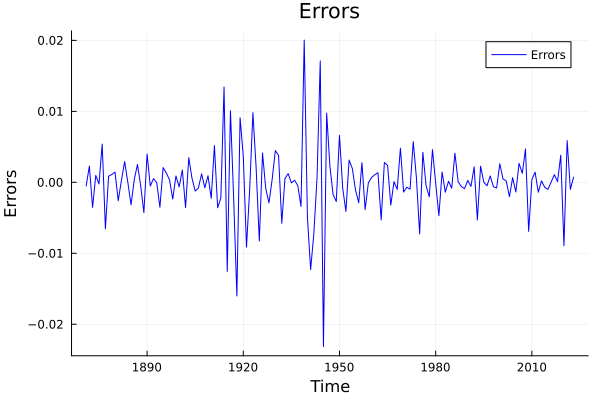

In [15]:
# Compute y_pred

state_indices = [1, 2+2*n_order-1] 

y_pred = alpha_mean[:, state_indices[1]] .+ alpha_mean[:, state_indices[2]]


# Adjust time and observed data if necessary
y_adjusted = y

println(size(y))
println(size(y_pred))

p = plot(dates, y_adjusted, label="Observed Data", color=:blue)
plot!(p, dates, y_pred, label="Predicted Data (Sum of States)", color=:red)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Data")
display(p)


errors = y_adjusted .- y_pred

p_error = plot(dates, errors, label="Errors", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)


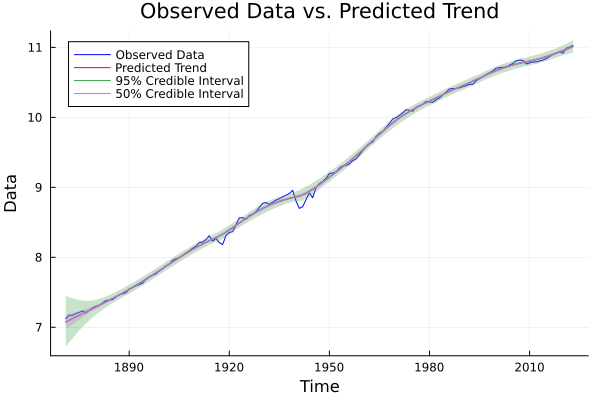

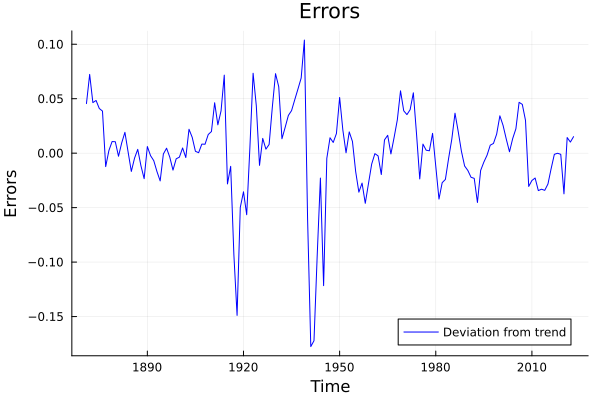

In [16]:




state_indices = [1, 2+2*n_order-1]  

y_pred = alpha_mean[:, state_indices[1]] 


# Adjust time and observed data if necessary
y_adjusted = y

p = plot(dates, y_adjusted, label="Observed Data", color=:blue)
plot!(p, dates, y_pred, label="Predicted Trend", color=:red)
xlabel!("Time")
ylabel!("Data")
title!("Observed Data vs. Predicted Trend")

# Add credible intervals using the `ribbon` argument
plot!(dates, y_pred, ribbon=(alpha_mean[:, state_indices[1]] .- alpha_lower[:, state_indices[1]],
      alpha_upper[:, state_indices[1]] .- alpha_mean[:, state_indices[1]]), fillalpha=0.3, label="95% Credible Interval")
plot!(dates, y_pred, ribbon=(alpha_mean[:, state_indices[1]] .- alpha_lower_68[:, state_indices[1]],
      alpha_upper_68[:, state_indices[1]] .- alpha_mean[:, state_indices[1]]), fillalpha=0.3, label="50% Credible Interval")

display(p)


errors = y_adjusted .- y_pred


p_error = plot(dates, errors, label="Deviation from trend", color=:blue)
xlabel!("Time")
ylabel!("Errors")
title!("Errors")
display(p_error)


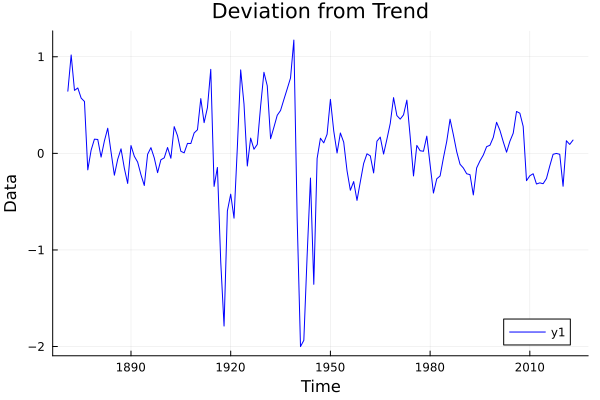

In [17]:




state_indices = [1, 2+2*n_order-1]  

y_pred = alpha_mean[:, state_indices[1]] 


# Adjust time and observed data if necessary
y_adjusted = y

p = plot(dates, (y_adjusted./y_pred.-1)*100, color=:blue)
xlabel!("Time")
ylabel!("Data")
title!("Deviation from Trend")

display(p)



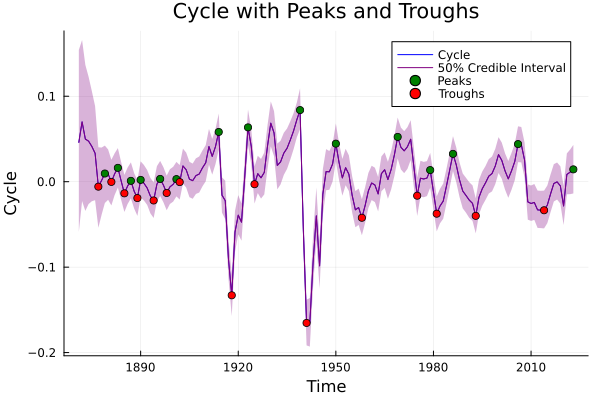

In [18]:
#Identifying peaks and troughs in the cycle
trend = alpha_mean[:, 1]
cycle = alpha_mean[:, end-1]
cycle_lower = alpha_lower_68[:, end-1]
cycle_upper = alpha_upper_68[:, end-1]



# Identify where cycle crosses zero
# zero_crossings = findall(i -> cycle_upper[i]*cycle_upper[i+1] < 0, 1:length(cycle)-1)
zero_crossings = findall(i -> cycle[i]*cycle[i+1] < 0, 1:length(cycle)-1)
# add last index to zero crossings
push!(zero_crossings, length(cycle))



# Identify peaks and troughs between zero-crossings
peaks = []
peak_indices = []
troughs = []
trough_indices = []

# for i in 1:(length(zero_crossings)-1)
#     # Define the segment between zero crossings
#     start_idx = zero_crossings[i] + 1
#     end_idx   = zero_crossings[i+1]
#     segment = cycle[start_idx:end_idx]

#     # Find local maximum (peak) in this interval
#     max_val = maximum(segment)
#     max_idx = argmax(segment) + start_idx - 1  # Convert segment index to full index
    
#     # Find local minimum (trough) in this interval
#     min_val = minimum(segment)
#     min_idx = argmin(segment) + start_idx - 1

    



#     # check if absolute value of trough is bigger than peak
#     if (abs(min_val) > abs(max_val))
#         push!(troughs, min_val)
#         push!(trough_indices, min_idx)
#     end
#     if (abs(max_val) > abs(min_val))
#         push!(peaks, max_val)
#         push!(peak_indices, max_idx)
#     end

# end

last_extremum = nothing

for i in 1:(length(zero_crossings)-1)
    # Define the segment between zero crossings
    start_idx = zero_crossings[i] + 1
    end_idx   = zero_crossings[i+1]
    segment = cycle[start_idx:end_idx]

    # Find local maximum (peak) in this interval
    max_val = maximum(segment)
    max_idx = argmax(segment) + start_idx - 1

    # Find local minimum (trough) in this interval
    min_val = minimum(segment)
    min_idx = argmin(segment) + start_idx - 1

    # Determine which extremum is dominant in this segment
    # and enforce alternation
    if abs(min_val) > abs(max_val)
        # We have a trough candidate
        if last_extremum != :trough
            push!(troughs, min_val)
            push!(trough_indices, min_idx)
            last_extremum = :trough
        end
    elseif abs(max_val) > abs(min_val)
        # We have a peak candidate
        if last_extremum != :peak
            push!(peaks, max_val)
            push!(peak_indices, max_idx)
            last_extremum = :peak
        end
    else
        # In case of a tie, you can decide to pick one or none.
        # For example, if last_extremum was a trough, pick a peak now, and vice versa:
        if last_extremum == :trough 
            push!(peaks, max_val)
            push!(peak_indices, max_idx)
            last_extremum = :peak
        else
            push!(troughs, min_val)
            push!(trough_indices, min_idx)
            last_extremum = :trough
        end
    end
end


#plot the cycle with peaks and troughs
p = plot(dates, cycle, label="Cycle", color=:blue)

# add credible intervals
plot!(dates, cycle, ribbon=(cycle .- cycle_lower, cycle_upper .- cycle), fillalpha=0.3, label="50% Credible Interval", color=:purple)

# add peaks and troughs
scatter!(p, dates[peak_indices], peaks, label="Peaks", color=:green)
scatter!(p, dates[trough_indices], troughs, label="Troughs", color=:red)
xlabel!("Time")
ylabel!("Cycle")
title!("Cycle with Peaks and Troughs")


display(p)




In [19]:

expansion_durations = Float64[]
contraction_durations = Float64[]
expansion_amplitudes = Float64[]
contraction_amplitudes = Float64[]


peak_to_peak_durations = Float64[]
trough_to_trough_durations = Float64[]


num_cycles = min(length(peak_indices), length(trough_indices))


for i in 1:(num_cycles) 
    # Expansion: trough[i] to peak[i]
    exp_dur = dates[peak_indices[i]] - dates[trough_indices[i]]
    push!(expansion_durations, exp_dur)
    exp_amp = peaks[i]
    push!(expansion_amplitudes, exp_amp)
    con_amp = troughs[i]
    push!(contraction_amplitudes, con_amp)
end

for i in 1:(num_cycles-1)
    # Contraction: peak[i] to trough[i+1]
    con_dur = dates[trough_indices[i+1]] - dates[peak_indices[i]]
    push!(contraction_durations, con_dur)
end

# For full cycle durations (peak-to-peak and trough-to-trough):
for i in 1:(length(peak_indices)-1)
    p2p = dates[peak_indices[i+1]] - dates[peak_indices[i]]
    push!(peak_to_peak_durations, p2p)
end

for i in 1:(length(trough_indices)-1)
    t2t = dates[trough_indices[i+1]] - dates[trough_indices[i]]
    push!(trough_to_trough_durations, t2t)
end

println("Expansion Durations: ", expansion_durations)
println("Contraction Durations: ", contraction_durations)
println("Peak-to-Peak Durations: ", peak_to_peak_durations)
println("Trough-to-Trough Durations: ", trough_to_trough_durations)
println("Expansion Amplitudes: ", expansion_amplitudes)
println("Contraction Amplitudes: ", contraction_amplitudes)


# Average characteristics:
avg_expansion_duration = mean(expansion_durations)
avg_contraction_duration = mean(contraction_durations)
avg_peak_to_peak_duration = mean(peak_to_peak_durations)
avg_trough_to_trough_duration = mean(trough_to_trough_durations)
avg_expansion_amplitude = mean(expansion_amplitudes)
avg_contraction_amplitude = mean(contraction_amplitudes)

println("Average Expansion Duration: ", avg_expansion_duration)
println("Average Contraction Duration: ", avg_contraction_duration)
println("Average Peak-to-Peak Duration: ", avg_peak_to_peak_duration)
println("Average Trough-to-Trough Duration: ", avg_trough_to_trough_duration)
println("Average Expansion Amplitude: ", avg_expansion_amplitude)
println("Average Contraction Amplitude: ", avg_contraction_amplitude)


# time with positve and negative cycle
count_above = count(x -> x > 0, cycle)
count_below = count(x -> x < 0, cycle)

println("Years with positive cycle: ", count_above)
println("Years with negative cycles: ", count_below)

# time with significantly positive and negative cycle
count_above = count(x -> x > 0, cycle_lower)
count_below = count(x -> x < 0, cycle_upper)

println("Years with significantly positive cycle: ", count_above)
println("Years with significantly negative cycles: ", count_below)





Expansion Durations: [2.0, 2.0, 2.0, 1.0, 2.0, 3.0, 12.0, 5.0, 14.0, 9.0, 11.0, 4.0, 5.0, 13.0, 9.0]
Contraction Durations: [2.0, 2.0, 2.0, 4.0, 2.0, 1.0, 4.0, 2.0, 2.0, 8.0, 6.0, 2.0, 7.0, 8.0]
Peak-to-Peak Durations: [4.0, 4.0, 3.0, 6.0, 5.0, 13.0, 9.0, 16.0, 11.0, 19.0, 10.0, 7.0, 20.0, 17.0]
Trough-to-Trough Durations: [4.0, 4.0, 4.0, 5.0, 4.0, 4.0, 16.0, 7.0, 16.0, 17.0, 17.0, 6.0, 12.0, 21.0]
Expansion Amplitudes: [0.00956605266649547, 0.016214075388749076, 0.0009923709844876047, 0.0021058583651513505, 0.003251282808207243, 0.0030293137460209105, 0.05820985615502789, 0.06355853435829834, 0.08379813037541013, 0.04451416761940038, 0.052414621008535035, 0.013582808072213083, 0.03257717105083405, 0.04402357006785367, 0.014441503481365825]
Contraction Amplitudes: [-0.005800767569541777, -0.00025603982912176284, -0.013608280761896453, -0.019150467638096167, -0.02196112760233483, -0.013207204592025347, -0.0004604361431862671, -0.13293773881306772, -0.002936406903519326, -0.1653018404603